# Demo 02 — Light-beads microscopy, ~40k neurons (SS004)


22 planes over a 5-minute recording. LBM needs three things a conventional
2P recording does not, all handled in `common/datasets.py`:

* **strip fusion** — the mesoscope writes several ROI strips per plane
  (`fuse_strips`, `fuse_shift_override=6`);
* **crosstalk subtraction** — the two cavities are interleaved in depth and
  bleed into each other (`subtract_crosstalk`, `cavity_size=13`);
* **plane reordering** — `planes` maps ScanImage's interleaved order back
  into depth order. This mapping is microscope-specific.

It also has lower per-voxel SNR, hence `intensity_thresh=1.0`,
`detection_timebin=6`, and `vox_snr_thresh=0.05`.

Data: `<data-root>/lbm/raw/*.tif` (13 tifs, 56.2 GB). The registered movie is
~38 GB and this notebook is slow. That is expected.


In [1]:
%matplotlib inline
# inline PNGs, never ipywidgets: nbconvert renders a stateless widget
# as a silently empty div, and these pages go on the public web.

import sys, os
sys.path.insert(0, os.path.abspath('..'))

import numpy as np
import matplotlib.pyplot as plt

from common import extract_batch, get_params, find_tifs
from suite3d.job import Job


In [2]:
params = get_params('lbm')

# `get_params` asserts that fs is a plausible *volume* rate.
# Never use io.get_vol_rate() -- it returns the per-plane rate.
nz = len(params['planes'])
print(f"{nz} planes, fs = {params['fs']:.4f} Hz (volume rate), "
      f"voxel {params['voxel_size_um']} um (dz, dy, dx)")

# Everything NOT listed here comes from suite3d.default_params.
for k, v in params.items():
    print(f'  {k:28s} {v}')


22 planes, fs = 4.1164 Hz (volume rate), voxel (20, 3.33, 3.33) um (dz, dy, dx)
  fs                           4.116358658453114
  tau                          1.3
  voxel_size_um                (20, 3.33, 3.33)
  planes                       [ 0  2  4  6  8 10 12 14 16 18 20 22 24  1  3  5  7  9 11 13 15 17]
  n_ch_tif                     26
  num_colors                   1
  functional_color_channel     0
  lbm                          True
  faced                        False
  cavity_size                  13
  subtract_crosstalk           True
  fuse_strips                  True
  fuse_shift_override          6
  3d_reg                       True
  apply_z_shift                False
  n_init_files                 4
  nonrigid                     True
  deduplicate                  True
  intensity_thresh             1.0
  detection_timebin            6
  cell_filt_xy_um              1.5
  cell_filt_z_um               10
  npil_filt_xy_um              100.0
  npil_filt_z_um         

In [3]:
# Point SUITE3D_DEMO_DATA at your figshare download, e.g.
#   export SUITE3D_DEMO_DATA=~/figshare
# Absolute paths are kept out of the notebook source on purpose: the
# executed outputs are published, and must not leak a filesystem layout.
DATA_ROOT = os.environ.get('SUITE3D_DEMO_DATA', './data')
OUT_DIR   = os.environ.get('SUITE3D_DEMO_OUT', './results')

tifs = find_tifs(DATA_ROOT, 'lbm')
print(f'{len(tifs)} tifs')

job = Job(OUT_DIR, 'demo-lbm', tifs=tifs, params=params,
          create=True, overwrite=True, verbosity=1)


13 tifs
Loading job directory for demo-lbm in <path>/s3d-revisions/demo-tests/nb02out
   Loading default params
   Updated main params file


## 1. Initialization

Reads the first few tifs, builds a 3D mean image, and estimates the
plane-to-plane shifts. This is the reference everything else registers to.

In [4]:
job.run_init_pass()
summary = job.load_summary()
ref = summary['ref_img_3d']            # (nz, ny, nx)
print('reference volume:', ref.shape)


   Saved a copy of params at <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/summary
   Updated main params file
Launching initial pass
Saving summary to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/summary/summary.npy
   Loading init tifs with 26 channels


    Loaded file into shared memory in 4.21 sec


    Workers completed in 1.99 sec
    Total time: 6.20 sec


    Loaded file into shared memory in 4.24 sec


    Workers completed in 2.46 sec
    Total time: 6.70 sec


    Loaded file into shared memory in 4.26 sec


    Workers completed in 2.86 sec
    Total time: 7.12 sec


    Loaded file into shared memory in 4.22 sec


    Workers completed in 3.34 sec
    Total time: 7.56 sec


   Loaded 4 files, total 10.62 GB


   Not enough frames in loaded tifs - using 400 init frames instead
   Loaded movie with 400 frames and shape 22, 900, 720


Estiamted crosstalk in 10.914287328720093s
   Subtracting with estimated coefficient 0.155


   Using 3d registration
   Computing plane alignment shifts


[[  0   0]
 [  2  -2]
 [  4  -4]
 [  6  -6]
 [  8  -9]
 [ 10 -12]
 [ 12 -15]
 [ 14 -18]
 [ 16 -21]
 [ 18 -23]
 [ 20 -25]
 [ 22 -27]
 [ 24 -29]
 [ 29 -46]
 [ 26 -43]
 [ 23 -40]
 [ 20 -37]
 [ 17 -34]
 [ 14 -31]
 [ 11 -28]
 [  8 -25]
 [  5 -22]]
yrange: (0, 29) xrange: (-46, 0)
ypad: [29] xpad: [46]
yshift: 0 xshift: 46
(22, 400, 929, 736)


   Applying plane alignment shifts


   Launching 3D GPU reference image calculation


   Saved init mov to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/summary/init_mov.npy
   Saving summary to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/summary/summary.npy


   Initial pass complete. See <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/summary for details


reference volume: (22, 929, 736)


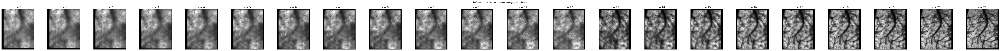

In [5]:
nz = ref.shape[0]
fig, axs = plt.subplots(1, nz, figsize=(3 * nz, 3.4))
for z, ax in enumerate(np.atleast_1d(axs)):
    ax.imshow(ref[z], cmap='gray',
              vmin=np.percentile(ref[z], 1), vmax=np.percentile(ref[z], 99.5))
    ax.set_title(f'z = {z}'); ax.axis('off')
fig.suptitle('Reference volume (mean image per plane)')
plt.tight_layout(); plt.show()


### What makes this recording LBM

The init pass estimates three things a conventional 2P recording never needs: the
crosstalk between the two cavities, the shift used to fuse the mesoscope's strips,
and the plane-to-plane offsets. `planes` reorders the interleaved cavities into
depth order.


cavity crosstalk coefficient : 0.155
strip fusion shift (px)      : 6
cavity_size                  : 13 planes per cavity
planes (acquisition order)   : [0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 1, 3, 5, 7, 9, 11, 13, 15, 17]


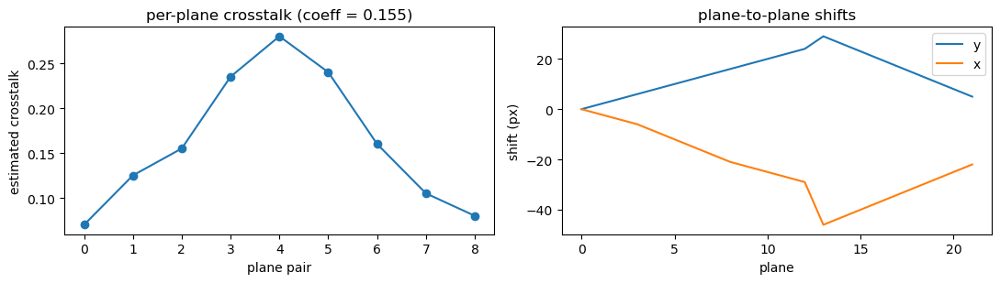

In [6]:
# All three are estimated during the init pass.
print(f"cavity crosstalk coefficient : {summary['crosstalk_coeff']:.3f}")
print(f"strip fusion shift (px)      : {summary['fuse_shift']}")
print(f"cavity_size                  : {params['cavity_size']} planes per cavity")
print(f"planes (acquisition order)   : {list(params['planes'])}")

fig, axs = plt.subplots(1, 2, figsize=(11, 3.2))
axs[0].plot(np.asarray(summary['crosstalk_planes']), 'o-')
axs[0].set_xlabel('plane pair')
axs[0].set_ylabel('estimated crosstalk')
axs[0].set_title(f"per-plane crosstalk (coeff = {summary['crosstalk_coeff']:.3f})")

ps = np.asarray(summary['plane_shifts'])
axs[1].plot(ps[:, 0], label='y')
axs[1].plot(ps[:, 1], label='x')
axs[1].set_xlabel('plane')
axs[1].set_ylabel('shift (px)')
axs[1].legend()
axs[1].set_title('plane-to-plane shifts')
plt.tight_layout()
plt.show()


## 2. Registration

3D rigid + non-rigid alignment of every volume to the reference, by FFT
phase correlation. The rigid offsets below should look like slow drift
plus small jitter; a trace that sits pinned at a constant value has hit
the edge of its search window.

In [7]:
job.register()


   Saved a copy of params at <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/registered_fused_data
   Updated main params file
   Starting registration: 3D: True, GPU: True


   Saved nonrigid 3D refs and masks to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/registered_fused_data/nonrigid_refs_3d.npy
   Overriding fuse shift value to 6
Will analyze 13 tifs in 13 batches
   Enforcing positivity
   Launching IO thread
Loading Batch 0 of 12


    Loaded file into shared memory in 4.29 sec


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


    Workers completed in 3.24 sec
    Total time: 7.53 sec


   Loaded 1 files, total 2.66 GB
   Batch 0 IO thread joined


   Launching IO thread for next batch


    Loaded file into shared memory in 4.52 sec


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


    Workers completed in 4.55 sec
    Total time: 9.07 sec


   Loaded 1 files, total 2.66 GB


   Completed rigid reg on batch in :20.564997673034668s


Loading Batch 1 of 12
   Batch 1 IO thread joined


   Launching IO thread for next batch


    Loaded file into shared memory in 4.53 sec


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


    Workers completed in 5.75 sec
    Total time: 10.28 sec


   Loaded 1 files, total 2.66 GB


   Completed rigid reg on batch in :21.070337295532227s


Loading Batch 2 of 12
   Batch 2 IO thread joined


   Launching IO thread for next batch


    Loaded file into shared memory in 4.65 sec


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


    Workers completed in 5.80 sec
    Total time: 10.45 sec


   Loaded 1 files, total 2.66 GB


   Completed rigid reg on batch in :21.395808935165405s


Loading Batch 3 of 12
   Batch 3 IO thread joined


   Launching IO thread for next batch


    Loaded file into shared memory in 4.60 sec


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


    Workers completed in 5.74 sec
    Total time: 10.34 sec


   Loaded 1 files, total 2.66 GB


   Completed rigid reg on batch in :21.281413793563843s


Loading Batch 4 of 12
   Batch 4 IO thread joined


   Launching IO thread for next batch


    Loaded file into shared memory in 4.58 sec


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


    Workers completed in 5.66 sec
    Total time: 10.25 sec


   Loaded 1 files, total 2.66 GB


   Completed rigid reg on batch in :21.149073600769043s


Loading Batch 5 of 12
   Batch 5 IO thread joined


   Launching IO thread for next batch


    Loaded file into shared memory in 4.54 sec


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


    Workers completed in 5.72 sec
    Total time: 10.26 sec


   Loaded 1 files, total 2.66 GB


   Completed rigid reg on batch in :21.06104850769043s


Loading Batch 6 of 12
   Batch 6 IO thread joined


   Launching IO thread for next batch


    Loaded file into shared memory in 4.58 sec


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


    Workers completed in 5.84 sec
    Total time: 10.43 sec


   Loaded 1 files, total 2.66 GB


   Completed rigid reg on batch in :21.2119882106781s


Loading Batch 7 of 12
   Batch 7 IO thread joined


   Launching IO thread for next batch


    Loaded file into shared memory in 4.56 sec


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


    Workers completed in 5.57 sec
    Total time: 10.12 sec


   Loaded 1 files, total 2.66 GB


   Completed rigid reg on batch in :20.923104524612427s


Loading Batch 8 of 12
   Batch 8 IO thread joined


   Launching IO thread for next batch


    Loaded file into shared memory in 4.50 sec


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


    Workers completed in 5.55 sec
    Total time: 10.05 sec


   Loaded 1 files, total 2.66 GB


   Completed rigid reg on batch in :20.91505217552185s


Loading Batch 9 of 12
   Batch 9 IO thread joined


   Launching IO thread for next batch


    Loaded file into shared memory in 4.49 sec


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


    Workers completed in 5.46 sec
    Total time: 9.95 sec


   Loaded 1 files, total 2.66 GB


   Completed rigid reg on batch in :20.63201069831848s


Loading Batch 10 of 12
   Batch 10 IO thread joined


   Launching IO thread for next batch


    Loaded file into shared memory in 4.59 sec


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


    Workers completed in 5.63 sec
    Total time: 10.22 sec


   Loaded 1 files, total 2.66 GB


   Completed rigid reg on batch in :21.11349129676819s


Loading Batch 11 of 12
   Batch 11 IO thread joined


   Launching IO thread for next batch


    Loaded file into shared memory in 4.49 sec


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


    Workers completed in 5.68 sec
    Total time: 10.17 sec


   Loaded 1 files, total 2.66 GB


   Completed rigid reg on batch in :20.943325757980347s


Loading Batch 12 of 12
   Batch 12 IO thread joined


   Completed rigid reg on batch in :15.36922001838684s


In [8]:
reg = job.load_registration_results()
print('registration keys:', sorted(reg.keys()))


registration keys: ['int_shift', 'metrics', 'nonrigid_refs', 'nonrigid_snrs', 'nonrigid_xshifts', 'nonrigid_yshifts', 'nonrigid_zshifts', 'pc_peak_loc', 'phase_corr_shifted', 'sub_pixel_shifts']


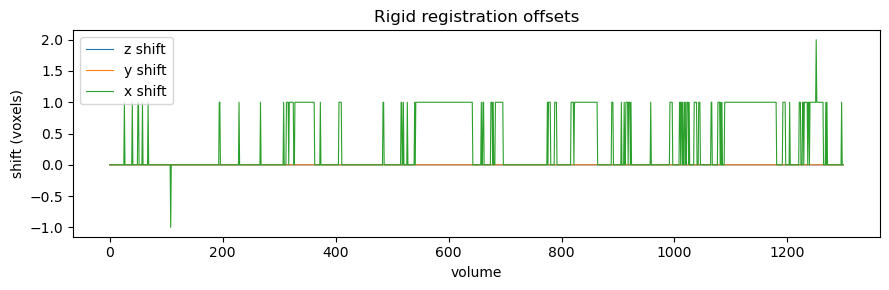

In [9]:
# Rigid registration offsets over time.
#
# `int_shift` is the integer voxel shift that was actually applied to each
# volume; `sub_pixel_shifts` is the raw phase-correlation estimate before
# rounding. Both are (n_volumes, 3) with columns ordered (z, y, x)
# -- see reg_3d.py.
#
# This demo sets apply_z_shift=False, so the z column below is *measured*
# but never applied to the movie.

shifts = np.asarray(reg['int_shift'])

fig, ax = plt.subplots(figsize=(9, 3))
for i, axis_name in enumerate(('z', 'y', 'x')):
    ax.plot(shifts[:, i], lw=0.8, label='%s shift' % axis_name)
ax.set_xlabel('volume')
ax.set_ylabel('shift (voxels)')
ax.legend()
ax.set_title('Rigid registration offsets')
plt.tight_layout()
plt.show()


## 3. Correlation map

The heart of Suite3D. Each voxel is scored by how correlated it is with
its neighbours over time, after filtering at a cell scale and a neuropil
scale. Cells light up as blobs; vessels and neuropil do not.

This is computed on the **whole volume at once**, which is what lets a
cell spanning several planes be found as one object.

In [10]:
job.calculate_corr_map()
cm = job.load_corr_map_results()
vmap, mean_img = cm['vmap'], cm['mean_img']
print('corr map:', vmap.shape)


   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/corrmap with tag corrmap
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/mov_sub with tag mov_sub
   Saved a copy of params at <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/corrmap
   Updated main params file


   Computing correlation map of movie with 1300 frames, volume shape: 22, 929, 736


corr map: (22, 929, 736)


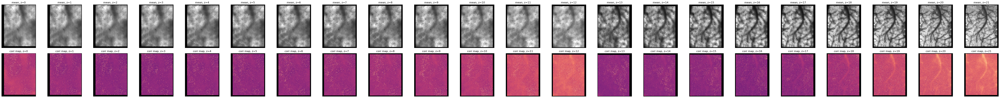

In [11]:
nz = vmap.shape[0]
fig, axs = plt.subplots(2, nz, figsize=(3 * nz, 6.5), squeeze=False)
for z in range(nz):
    axs[0, z].imshow(mean_img[z], cmap='gray',
                     vmax=np.percentile(mean_img[z], 99.5))
    axs[0, z].set_title(f'mean, z={z}'); axs[0, z].axis('off')
    axs[1, z].imshow(vmap[z], cmap='magma',
                     vmax=np.percentile(vmap[z], 99.5))
    axs[1, z].set_title(f'corr map, z={z}'); axs[1, z].axis('off')
plt.tight_layout(); plt.show()


## 4. Segmentation

Peaks in the correlation map seed ROIs; each seed is grown into a 3D
footprint, then subtracted so the next iteration finds the next cell.
Voxels join an ROI when they pass `vox_snr_thresh`.

In [12]:
job.segment_rois()
stats = job.load_segmentation_results(to_load=['stats'])
print(f'{len(stats)} ROIs detected')


   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation with tag segmentation
   Saved a copy of params at <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation
   Updated main params file
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/rois with tag rois
   Saving results to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation and <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/rois 
dict_keys(['max_img', 'mean_img', 'vmap', 'vmap_raw', 'all_params'])


   Detecting from patch 1 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0000 with tag segmentation-patch-0000


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
Extracted 988 ROIs; no more candidates found above peak 0.10, stopping.


   Found 988 cells in 64 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0000/stats.npy


   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0000/iscell.npy
   Detecting from patch 2 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0001 with tag segmentation-patch-0001


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.02743195


0.02743195


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.02743195


0.02743195


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.02743195
0.02743195


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.02743195


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.02743195
0.02743195


0.02743195
0.02743195


0.02743195
0.02743195


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.02743195
0.02743195


0.02743195
0.02743195


0.02743195
0.02743195


0.02743195
0.02743195


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.02743195
0.02743195


0.02743195
0.02743195


0.02743195
0.02743195


0.02743195
0.02743195


0.02743195
0.02743195


0.02743195
0.02743195


0.02743195
0.02743195


0.02743195
0.02743195


0.02743195
0.02743195


0.02743195


0.02743195
0.02743195


0.02743195
0.02743195


0.02743195
0.02743195


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.02743195
0.02743195


0.02743195
0.02743195


0.02743195


0.02743195
0.02743195


0.02743195
0.02743195
0.02743195
Extracted 872 ROIs; no more candidates found above peak 0.10, stopping.


   Found 872 cells in 57 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0001/stats.npy


   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0001/iscell.npy
   Detecting from patch 3 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0002 with tag segmentation-patch-0002


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.047155872
0.047155872


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.047155872


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.047155872
0.047155872


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.047155872
0.047155872


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0


0.0
0.0


0.0
0.0


0.0
0.0
0.0
Extracted 901 ROIs; no more candidates found above peak 0.10, stopping.


   Found 901 cells in 59 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0002/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0002/iscell.npy
   Detecting from patch 4 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0003 with tag segmentation-patch-0003


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
0.0


0.0
0.0


0.0
0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0


0.0
0.0
0.0
Extracted 1656 ROIs; no more candidates found above peak 0.10, stopping.


   Found 1656 cells in 105 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0003/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0003/iscell.npy
   Detecting from patch 5 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0004 with tag segmentation-patch-0004


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
Extracted 827 ROIs; no more candidates found above peak 0.10, stopping.


   Found 827 cells in 53 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0004/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0004/iscell.npy
   Detecting from patch 6 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0005 with tag segmentation-patch-0005


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.022839278


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.022839278
0.022839278


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.022839278
0.022839278


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.022839278
0.022839278


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.022839278
0.022839278


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.022839278
0.022839278


0.022839278
0.022839278


0.022839278
0.022839278


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.022839278
0.022839278


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.022839278
0.022839278


0.022839278
0.022839278


0.022839278
0.022839278


0.022839278
0.022839278


0.022839278
0.022839278


0.022839278
0.022839278


0.022839278
0.022839278


0.022839278
0.022839278


0.022839278
0.022839278


0.022839278
0.022839278


0.022839278
0.022839278


0.022839278
0.022839278


0.022839278
0.022839278


0.022839278
0.022839278


0.022839278
0.022839278
0.022839278
Extracted 745 ROIs; no more candidates found above peak 0.10, stopping.


   Found 745 cells in 49 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0005/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0005/iscell.npy
   Detecting from patch 7 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0006 with tag segmentation-patch-0006


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
0.0
Extracted 862 ROIs; no more candidates found above peak 0.10, stopping.


   Found 862 cells in 56 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0006/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0006/iscell.npy
   Detecting from patch 8 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0007 with tag segmentation-patch-0007


0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894


0.032077894
0.032077894
0.032077894
Extracted 886 ROIs; no more candidates found above peak 0.10, stopping.


   Found 886 cells in 57 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0007/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0007/iscell.npy
   Detecting from patch 9 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0008 with tag segmentation-patch-0008


0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
0.0
Extracted 942 ROIs; no more candidates found above peak 0.10, stopping.


   Found 942 cells in 61 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0008/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0008/iscell.npy
   Detecting from patch 10 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0009 with tag segmentation-patch-0009


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
Extracted 1360 ROIs; no more candidates found above peak 0.10, stopping.


   Found 1360 cells in 87 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0009/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0009/iscell.npy
   Detecting from patch 11 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0010 with tag segmentation-patch-0010


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704


0.061561704
0.061561704
0.061561704


0.061561704
Extracted 972 ROIs; no more candidates found above peak 0.10, stopping.


   Found 972 cells in 63 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0010/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0010/iscell.npy
   Detecting from patch 12 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0011 with tag segmentation-patch-0011


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
0.0
Extracted 722 ROIs; no more candidates found above peak 0.10, stopping.


   Found 722 cells in 48 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0011/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0011/iscell.npy
   Detecting from patch 13 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0012 with tag segmentation-patch-0012


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
Extracted 790 ROIs; no more candidates found above peak 0.10, stopping.


   Found 790 cells in 51 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0012/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0012/iscell.npy
   Detecting from patch 14 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0013 with tag segmentation-patch-0013


0.05548632


0.05548632


0.05548632


0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632


0.05548632
0.05548632
Extracted 979 ROIs; no more candidates found above peak 0.10, stopping.


   Found 979 cells in 63 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0013/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0013/iscell.npy
   Detecting from patch 15 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0014 with tag segmentation-patch-0014


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025


0.019578025
0.019578025
Extracted 892 ROIs; no more candidates found above peak 0.10, stopping.


   Found 892 cells in 58 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0014/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0014/iscell.npy
   Detecting from patch 16 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0015 with tag segmentation-patch-0015


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0


0.0
0.0


0.0
0.0


0.0
0.0
Extracted 895 ROIs; no more candidates found above peak 0.10, stopping.


   Found 895 cells in 58 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0015/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0015/iscell.npy
   Detecting from patch 17 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0016 with tag segmentation-patch-0016


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
Extracted 898 ROIs; no more candidates found above peak 0.10, stopping.


   Found 898 cells in 58 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0016/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0016/iscell.npy
   Detecting from patch 18 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0017 with tag segmentation-patch-0017


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
Extracted 833 ROIs; no more candidates found above peak 0.10, stopping.


   Found 833 cells in 54 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0017/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0017/iscell.npy
   Detecting from patch 19 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0018 with tag segmentation-patch-0018


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0


0.0
0.0


0.0
0.0
Extracted 870 ROIs; no more candidates found above peak 0.10, stopping.


   Found 870 cells in 56 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0018/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0018/iscell.npy
   Detecting from patch 20 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0019 with tag segmentation-patch-0019


0.0


0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
Extracted 967 ROIs; no more candidates found above peak 0.10, stopping.


   Found 967 cells in 62 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0019/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0019/iscell.npy
   Detecting from patch 21 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0020 with tag segmentation-patch-0020


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
Extracted 857 ROIs; no more candidates found above peak 0.10, stopping.


   Found 857 cells in 55 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0020/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0020/iscell.npy
   Detecting from patch 22 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0021 with tag segmentation-patch-0021


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173


0.016382173
0.016382173
Extracted 974 ROIs; no more candidates found above peak 0.10, stopping.


   Found 974 cells in 63 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0021/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0021/iscell.npy
   Detecting from patch 23 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0022 with tag segmentation-patch-0022


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156


0.033331156
0.033331156
Extracted 1002 ROIs; no more candidates found above peak 0.10, stopping.


   Found 1002 cells in 64 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0022/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0022/iscell.npy
   Detecting from patch 24 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0023 with tag segmentation-patch-0023


0.01800485
0.01800485


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.01800485
0.01800485


0.01800485
0.01800485


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.01800485
0.01800485


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.01800485
0.01800485


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.01800485
0.01800485


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.01800485
0.01800485


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.01800485
0.01800485


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485


0.01800485
0.01800485
0.01800485
Extracted 1125 ROIs; no more candidates found above peak 0.10, stopping.


   Found 1125 cells in 72 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0023/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0023/iscell.npy
   Detecting from patch 25 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0024 with tag segmentation-patch-0024


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0
Extracted 756 ROIs; no more candidates found above peak 0.10, stopping.


   Found 756 cells in 49 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0024/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0024/iscell.npy
   Detecting from patch 26 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0025 with tag segmentation-patch-0025


0.024748787


0.024748787
0.024748787


0.024748787
0.024748787


0.024748787
0.024748787


0.024748787
0.024748787


0.024748787
0.024748787


0.024748787
0.024748787


0.024748787
0.024748787


0.024748787
0.024748787


0.024748787
0.024748787


0.024748787
0.024748787


0.024748787
0.024748787


0.024748787
0.024748787


0.024748787
0.024748787


0.024748787
0.024748787


0.024748787
0.024748787


0.024748787
0.024748787


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
Extracted 908 ROIs; no more candidates found above peak 0.10, stopping.


   Found 908 cells in 58 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0025/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0025/iscell.npy
   Detecting from patch 27 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0026 with tag segmentation-patch-0026


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
Extracted 774 ROIs; no more candidates found above peak 0.10, stopping.


   Found 774 cells in 51 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0026/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0026/iscell.npy
   Detecting from patch 28 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0027 with tag segmentation-patch-0027


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
0.0


0.0
Extracted 875 ROIs; no more candidates found above peak 0.10, stopping.


   Found 875 cells in 57 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0027/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0027/iscell.npy
   Detecting from patch 29 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0028 with tag segmentation-patch-0028


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
Extracted 1028 ROIs; no more candidates found above peak 0.10, stopping.


   Found 1028 cells in 66 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0028/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0028/iscell.npy
   Detecting from patch 30 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0029 with tag segmentation-patch-0029


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
0.0
Extracted 951 ROIs; no more candidates found above peak 0.10, stopping.


   Found 951 cells in 62 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0029/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0029/iscell.npy
   Detecting from patch 31 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0030 with tag segmentation-patch-0030


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0
0.0
Extracted 644 ROIs; no more candidates found above peak 0.10, stopping.


   Found 644 cells in 42 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0030/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0030/iscell.npy
   Detecting from patch 32 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0031 with tag segmentation-patch-0031


0.12218347


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
0.0
Extracted 786 ROIs; no more candidates found above peak 0.10, stopping.


   Found 786 cells in 51 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0031/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0031/iscell.npy
   Detecting from patch 33 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0032 with tag segmentation-patch-0032


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
Extracted 715 ROIs; no more candidates found above peak 0.10, stopping.


   Found 715 cells in 46 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0032/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0032/iscell.npy
   Detecting from patch 34 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0033 with tag segmentation-patch-0033


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0


0.0
0.0
Extracted 837 ROIs; no more candidates found above peak 0.10, stopping.


   Found 837 cells in 54 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0033/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0033/iscell.npy
   Detecting from patch 35 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0034 with tag segmentation-patch-0034


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283


0.04423283
0.04423283
0.04423283
Extracted 938 ROIs; no more candidates found above peak 0.10, stopping.


   Found 938 cells in 61 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0034/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0034/iscell.npy
   Detecting from patch 36 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0035 with tag segmentation-patch-0035


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
Extracted 965 ROIs; no more candidates found above peak 0.10, stopping.


   Found 965 cells in 62 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0035/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0035/iscell.npy
   Detecting from patch 37 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0036 with tag segmentation-patch-0036


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
Extracted 491 ROIs; no more candidates found above peak 0.10, stopping.


   Found 491 cells in 32 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0036/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0036/iscell.npy
   Detecting from patch 38 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0037 with tag segmentation-patch-0037


0.05142778
0.05142778


0.05142778


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
0.0
Extracted 694 ROIs; no more candidates found above peak 0.10, stopping.


   Found 694 cells in 45 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0037/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0037/iscell.npy
   Detecting from patch 39 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0038 with tag segmentation-patch-0038


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258
0.04375258


0.04375258


0.04375258
0.04375258
Extracted 834 ROIs; no more candidates found above peak 0.10, stopping.


   Found 834 cells in 54 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0038/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0038/iscell.npy
   Detecting from patch 40 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0039 with tag segmentation-patch-0039


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024


0.064855024
0.064855024
0.064855024


Extracted 802 ROIs; no more candidates found above peak 0.10, stopping.


   Found 802 cells in 52 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0039/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0039/iscell.npy
   Detecting from patch 41 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0040 with tag segmentation-patch-0040


0.0
0.0


0.0


0.0
0.0


0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0


0.0
0.0


0.0
0.0
0.0
Extracted 869 ROIs; no more candidates found above peak 0.10, stopping.


   Found 869 cells in 57 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0040/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0040/iscell.npy
   Detecting from patch 42 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0041 with tag segmentation-patch-0041


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0


0.0
0.0
0.0
Extracted 843 ROIs; no more candidates found above peak 0.10, stopping.


   Found 843 cells in 55 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0041/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0041/iscell.npy
   Detecting from patch 43 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0042 with tag segmentation-patch-0042


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
0.0
0.0
Extracted 627 ROIs; no more candidates found above peak 0.10, stopping.


   Found 627 cells in 42 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0042/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0042/iscell.npy
   Detecting from patch 44 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0043 with tag segmentation-patch-0043


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.025055468
0.025055468


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.025055468
0.025055468


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.025055468
0.025055468


0.025055468
0.025055468


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.025055468
0.025055468


0.025055468
0.025055468


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.025055468
0.025055468


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.025055468
0.025055468


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.025055468
0.025055468


0.025055468
0.025055468


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.025055468
0.025055468


0.025055468
0.025055468


0.025055468
0.025055468


0.025055468
0.025055468


0.025055468
0.025055468


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.025055468
0.025055468


0.025055468
0.025055468


0.025055468
0.025055468


0.025055468
0.025055468


0.025055468
0.025055468
0.025055468
Extracted 628 ROIs; no more candidates found above peak 0.10, stopping.


   Found 628 cells in 42 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0043/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0043/iscell.npy
   Detecting from patch 45 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0044 with tag segmentation-patch-0044


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0
Extracted 639 ROIs; no more candidates found above peak 0.10, stopping.


   Found 639 cells in 41 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0044/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0044/iscell.npy
   Detecting from patch 46 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0045 with tag segmentation-patch-0045


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
0.0
Extracted 717 ROIs; no more candidates found above peak 0.10, stopping.


   Found 717 cells in 48 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0045/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0045/iscell.npy
   Detecting from patch 47 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0046 with tag segmentation-patch-0046


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0


0.0
0.0


0.0
0.0
Extracted 867 ROIs; no more candidates found above peak 0.10, stopping.


   Found 867 cells in 56 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0046/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0046/iscell.npy
   Detecting from patch 48 / 48
   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0047 with tag segmentation-patch-0047


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


<home>/packages/s3d-dev/suite3d/suite3d/segmentation.py:217: RuntimeWarning: invalid value encountered in divide
  vox_snrs = v1_u**2 / (variances[cz,cy,cx] - v1_u**2)


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0


0.0
0.0
Extracted 715 ROIs; no more candidates found above peak 0.10, stopping.


   Found 715 cells in 47 iterations
   Saving cells to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0047/stats.npy
   Saving iscell.npy to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/segmentation/patch-0047/iscell.npy
['idx', 'threshold', 'coords', 'lam', 'med', 'peak_val', 'npcoords', 'patch_idx', 'med_patch', 'v1_u', 'v1h_u', 'v2_u', 'vox_snrs', 'f1f2', 'f1_u', 'f2_u', 'active_frames', 'contamination_factor', 'npixs', 'worker_idx', 'patch_idx', 'offset', 'extraction_time', 'elapsed_time', 'vmap_slope', 'vmap_int']


   Combined 48 patches, 40606 cells
   Saving combined files to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/rois


40606 ROIs detected


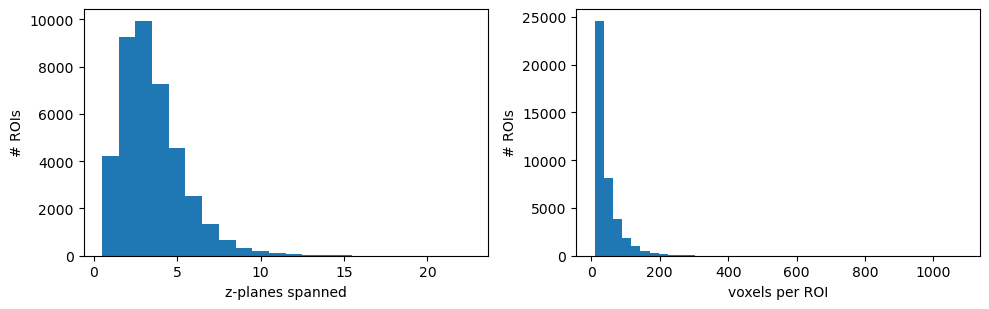

median z-span 3 planes, 90% of ROIs span more than one plane


In [13]:
# How far do ROIs extend in z? Multi-plane cells are the point of 3D detection.
zspan = np.array([s['coords'][0].max() - s['coords'][0].min() + 1 for s in stats])
npix  = np.array([len(s['lam']) for s in stats])

fig, axs = plt.subplots(1, 2, figsize=(10, 3.2))
axs[0].hist(zspan, bins=np.arange(0.5, zspan.max() + 1.5))
axs[0].set_xlabel('z-planes spanned'); axs[0].set_ylabel('# ROIs')
axs[1].hist(npix, bins=40)
axs[1].set_xlabel('voxels per ROI'); axs[1].set_ylabel('# ROIs')
plt.tight_layout(); plt.show()
print(f'median z-span {np.median(zspan):.0f} planes, '
      f'{(zspan > 1).mean() * 100:.0f}% of ROIs span more than one plane')


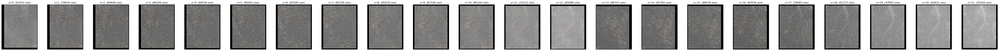

In [14]:
# ROI footprints painted onto the correlation map, plane by plane.
lbl = np.zeros(vmap.shape, dtype=int)
for i, s in enumerate(stats):
    zc, yc, xc = s['coords']
    lbl[zc, yc, xc] = i + 1

nz = vmap.shape[0]
fig, axs = plt.subplots(1, nz, figsize=(3 * nz, 3.4), squeeze=False)
for z in range(nz):
    axs[0, z].imshow(vmap[z], cmap='gray', vmax=np.percentile(vmap[z], 99.5))
    m = np.ma.masked_where(lbl[z] == 0, lbl[z] % 20 + 1)
    axs[0, z].imshow(m, cmap='tab20', alpha=0.65, interpolation='nearest')
    axs[0, z].set_title(f'z={z}  ({(lbl[z] > 0).sum()} vox)'); axs[0, z].axis('off')
plt.tight_layout(); plt.show()


## 5. Neuropil masks, traces, deconvolution

An annular neuropil mask is built around each ROI; `F` is the raw trace,
`Fneu` the surrounding neuropil, and the corrected trace is
`F - npil_coeff * Fneu`. `spks` is the deconvolved estimate.

In [15]:
job.compute_npil_masks()

# Trace extraction sets this pipeline's peak memory. Suite3D's default of
# 500 volumes per batch costs ~56 GiB on a 22-plane LBM volume; snapping the
# batch to whole on-disk chunks is both cheaper and faster. See
# common/pipeline.py:extract_batch.
job.extract_and_deconvolve(batchsize_frames=extract_batch(job))

res = job.load_segmentation_results(to_load=['F', 'Fneu', 'spks'])
F, Fneu, spks = res['F'], res['Fneu'], res['spks']
print('traces:', F.shape, '(n_rois, n_volumes)')


[12:32:13] extraction batch: 100 volumes = 1 x 100-volume chunk (~11.2 GiB incl. the shmem copy)


   Updated main params file


   Movie shape: (22, 1300, 929, 736)
   Extracting 40606 valid cells, and saving cell flags to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/rois/iscell_extracted.npy
   Extracting activity
   Saving intermediate results to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/rois


Deduplicating ROIs (dist<=15.0 um, corr>=0.950)


   Removed 0 duplicate ROIs (kept 40606/40606)
   Deconvolving


   Saving to <path>/s3d-revisions/demo-tests/nb02out/s3d-demo-lbm/rois


traces: (40606, 1300) (n_rois, n_volumes)


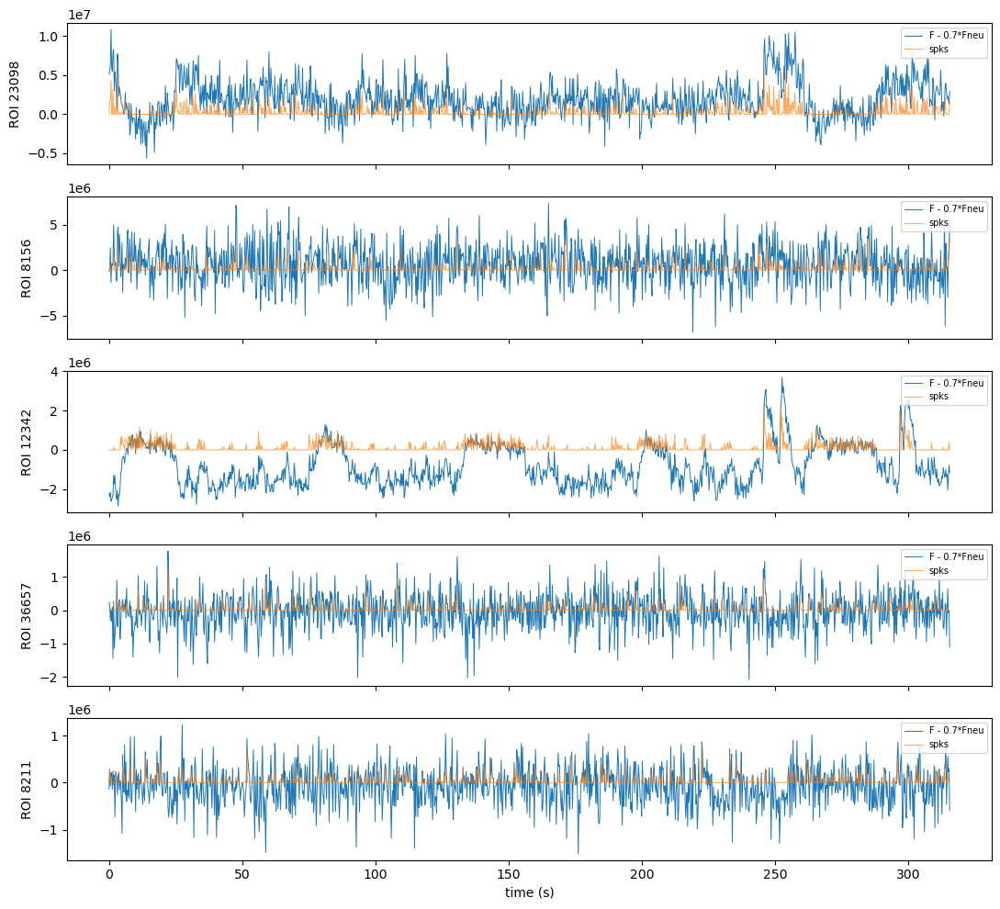

In [16]:
fs = params['fs']                      # volume rate -> seconds
t = np.arange(F.shape[1]) / fs

# The most active ROIs, by deconvolved activity.
order = np.argsort(spks.sum(1))[::-1][:5]
fig, axs = plt.subplots(len(order), 1, figsize=(11, 2 * len(order)), sharex=True)
for ax, i in zip(np.atleast_1d(axs), order):
    ax.plot(t, F[i] - 0.7 * Fneu[i], lw=0.7, label='F - 0.7*Fneu')
    ax.plot(t, spks[i], lw=0.7, alpha=0.7, label='spks')
    ax.set_ylabel(f'ROI {i}'); ax.legend(loc='upper right', fontsize=7)
np.atleast_1d(axs)[-1].set_xlabel('time (s)')
plt.tight_layout(); plt.show()


## 6. Browse the result

Export, and open the portable HTML viewer (or napari).

In [17]:
job.export_results(OUT_DIR, make_viewer=True) \
    if hasattr(job, 'make_html_viewer') else job.export_results(OUT_DIR)

# Or, in napari:
#   from suite3d.ui import create_napari_ui   # NB: ui.py, not curation.py
#   import napari
#   outputs = job.load_segmentation_results()
#   outputs.update(job.load_corr_map_results())
#   create_napari_ui(outputs, scale=params['voxel_size_um'])
#   napari.run()


   Created dir <path>/s3d-revisions/demo-tests/nb02out/s3d-results-demo-lbm to export results


   <path>/s3d-revisions/demo-tests/data/lbm/raw/2024-07-30_1_SS004_2P_00001_00001.tif is 100 frames and 4326814882 bytes


   make_html_viewer: 40606 ROIs -> <path>/s3d-revisions/demo-tests/nb02out/s3d-results-demo-lbm


   make_html_viewer: open <path>/s3d-revisions/demo-tests/nb02out/s3d-results-demo-lbm/viewer.html


'<path>/s3d-revisions/demo-tests/nb02out/s3d-results-demo-lbm'

Equivalent one-liner:

```bash
python run_pipeline.py --data-root /path/to/figshare --out-dir ./results
```
